<a href="https://colab.research.google.com/github/chrisogonas/58422-codepath-security/blob/main/Language_of_Proteins_EDA_and_Data_Lineage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LANGUAGE OF PROTEINS

## Requirements

https://canvas.instructure.com/courses/5752963/assignments/34759973

💎 Capstone Assignment: EDA & Data Lineage
Due Saturday by 8:59am Points 10 Submitting a website url or a file upload File Types ipynb

Based on the discussion and the assignment in Week 4, apply the appropriate EDA to your capstone data.

To do:

*   Document in markdown data lineage, or where the data came from, and metadata to help us understand your capstone
*   Perform initial EDA in notebook
*   Include any open questions or issues that you need help with in markdown at the end of your EDA.
 

Deliverables (one set required per capstone group!):

1. The notebook with performed EDA in .ipynb format or a link to your colab if you chose to use colab.

## Analysis



💎 Overall Data Characteristics:

Three Data Sets have been provided by the partner company

They have 2 to 4 attributes/fields including a sequence of amino acids defining the protein(ex ALWKNMLKGIGKLAGKAALGAVKKLVGAES) and a label (1: the protein has a ACP, AMP or DNA characteristic, 0 it does not) 

Dataset Characteristics are:

*   ACP: 344 (sequence, label) tuples in test_data.csv, 1,378 in train_data.csv. The sequence are between 2 and 50 characters long.
*   AMP: 4042 (PDBs_Code, sequenceID, label) tuples in all_data.csv. The sequence are between 11 and 183 characters long.
*   DNA binding: 2,272 (code, sequence,label, origin) tuples in test.csv and 14,189 train.csv. The sequence are between 47 and 4911 characters long.
 

One letter of the alphabet is used for each of the 20 amino acids that can make a protein. The letters B, J, O, U, X, Z are not used 


## ACP Data Analysis

Notes on ACP data

*   test_data.csv and train_data.csv are located at https://github.com/gillesbouyer/4brain/upload/main
*   We will use 
**    profile reports and widget from Pandas to explore the data
**    explore the frequencies of the letters used in the chains


In [ ]:
# ACP
%load_ext autoreload
%autoreload 2
 

In [ ]:
import sys

# !"{sys.executable}" -m pip install -U pandas-profiling[notebook]
# !pip install -U pandas_profiling
# !jupyter nbextension enable --py widgetsnbextension

In [ ]:
# Standard Library Imports
from pathlib import Path

# Installed packages
import pandas as pd
from ipywidgets import widgets
import seaborn as sns

# Our package
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

In [ ]:
%matplotlib inline

In [ ]:
acp = pd.read_csv('/content/acp/train_data.csv')
acp['length'] = acp['sequences'].str.len()
import numpy as np
acp['loglen']=np.log(acp['length'])

In [ ]:
# !wget('https://raw.githubusercontent.com/gillesbouyer/4brain/blob/main/train_data.csv')

In [ ]:
# !ls 

In [ ]:
profile1 = ProfileReport(
    acp, title="ACP Train Set", html={"style": {"full_width": True}}, sort=None
)
profile1.to_widgets()
profile1

# in overview of sequences variable, overvier there are 1,378 unique values. 
# In the sequence variable characters the most used letters in the chain are K (12%),L(10%),G (9.6%), A,C,I,R,V,S,F

# In the label tab, there are 689 "0" labels and 689 "1" labels

# the length distribution 



/usr/local/lib/python3.8/dist-packages/pandas_profiling/profile_report.py:452: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# looking at the characteristics of the chains which have the ACP property (label = 1)
acp1 = acp[(acp['label']==1)]
acp1.shape

(689, 4)

In [ ]:
profile11 = ProfileReport(
    acp1, title="ACP Train Set label=1", html={"style": {"full_width": True}}, sort=None
)
profile11.to_widgets()
profile11

/usr/local/lib/python3.8/dist-packages/pandas_profiling/profile_report.py:452: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# letters not used: BJOUXZ
# letters mostly used: KLGACIRVSF k:15%, L:12% , G: 10%

# building a string of all the chains separated by "blank" so that there cannot be combinations of last letter of a chain and first of the next one
a = ' '
for i in range(acp1.shape[0]):
    a = a + acp1['sequences'].iloc[i] + ' '

In [ ]:
#function to count how many times a string is in another string
def ms(main,sub):
    x = main.count(sub)
    return x
ms('ATCDLLSKWNWNHTACAGHCIAKGFKGGYCNDKAVCVCRN','VC')

2

In [ ]:
# building a dataframe: number associated to a pair of letters /pair of letters / number of time the pair of letters appears
dfc = pd.DataFrame([])
dfplus = pd.DataFrame([])
k = 0
for x in ['A','C','D','E','F','G','H','I','K','L','M','N','P','Q','R','S','T','V','W','Y']:
    for y in ['A','C','D','E','F','G','H','I','K','L','M','N',
              'P','Q','R','S','T','V','W','Y']:
        plus = {'cle':[k+1],'pair':[x+y],'present':[ms(a,x+y)]}
        dfplus = pd.DataFrame(plus)
         #number associated to the pair
         # pair of letters EX: AC
         # Number of times AC is present in all the sequences
        dfc = pd.concat([dfplus,dfc])
        k=k+1

In [ ]:
dfc

,cle,pair,present
0,400,YY,6
0,399,YW,9
0,398,YV,4
0,397,YT,10
0,396,YS,12
...,...,...,...
0,5,AF,48
0,4,AE,29
0,3,AD,24
0,2,AC,43


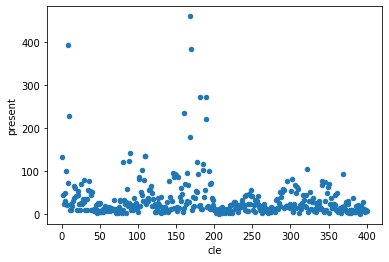

In [ ]:
dfc.plot.scatter(x='cle',y='present')
# the combination 'AA' is the number 0 and it appears 132 times overall

## AMP Data Analysis

Notes on AMP data

*   For PDBs beginning with 'UniRef50' can be looked up at https://www.uniprot.org/uniprotkb/Q9HE07/entry
*   Check whether the other ones can be looked up as well

In [ ]:
import pandas as pd
import seaborn as sns

In [ ]:
amp = pd.read_csv('/content/amp/all_data.csv')

In [ ]:
amp['SequenceID_length'] = amp['SequenceID'].str.len()

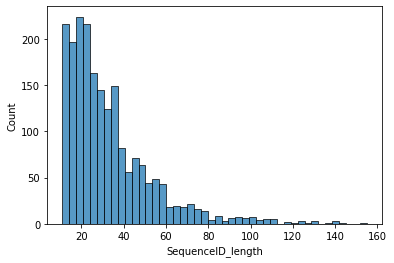

In [ ]:
sns.histplot(data=amp[amp['label']==0], x='SequenceID_length')

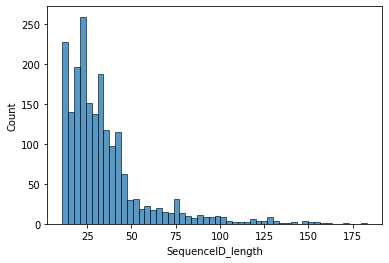

In [ ]:
sns.histplot(data=amp[amp['label']==1], x='SequenceID_length')

In [ ]:
amp.head(10)

,PDBs_code,SequenceID,label,SequenceID_length
0,AP02484,GMASKAGSVLGKITKIALGAL,1,21
1,AP02630,NIGLFTSTCFSSQCFSSKCFTDTCFSSNCFTGRHQCGYTHGSC,1,43
2,AP01427,GAIKDALKGAAKTVAVELLKKAQCKLEKTC,1,30
3,AP02983,FFGRLKAVFRGARQGWKEHRY,1,21
4,AP01815,DFGCARGMIFVCMRRCARMYPGSTGYCQGFRCMCDTMIPIRRPPFIMG,1,48
5,AP00779,GRRKRKWLRRIGKGVKIIGGAALDHL,1,26
6,AP02952,LLMRKLIKGYGYLFGKGKRKKR,1,22
7,AP01652,LIDHLGAPRWAVDTILGAIAVGNLASWVLALVPGPGWAVKAGLATA...,1,61
8,AP01771,ILPLLLGKVVCAITKKC,1,17
9,AP02248,FKKKKRNIGTFVFFAIALFCTVMFAYLLLTNQYVPIDYNVPRYA,1,44


In [ ]:
amp.shape

(4042, 4)

In [ ]:
amp.sample(5)

,PDBs_code,SequenceID,label,SequenceID_length
250,AP01543,KPWRFRRAIRRVRWRKVAPYIPFVVKTVGKK,1,31
3672,UniRef50_A9A5K8,NLKTKPKVSTILSSFKKLSKLHEMILVEGMGGIMTPILKDYY,0,42
2131,UniRef50_Q0BPE6,GVNLVLALAEKMAAALPGNRYD,0,22
1050,AP02734,FFGRLKSMWRGARGGLKAYKYQKDMAKMNKRYGPNWQQGGGQEPPA...,1,55
2965,UniRef50_Q58931,YCTMCDAFFYLNKEVIVIGRDTPAIMSAINLKDIAK,0,36


In [ ]:
amp.columns

Index(['PDBs_code', 'SequenceID', 'label', 'SequenceID_length'], dtype='object')

In [ ]:
amp.isnull().sum()

PDBs_code            0
SequenceID           0
label                0
SequenceID_length    0
dtype: int64

In [ ]:
amp.nunique(axis=0)

PDBs_code            4042
SequenceID           4042
label                   2
SequenceID_length     133
dtype: int64

In [ ]:
amp.describe()

,label,SequenceID_length
count,4042.000000,4042.000000
mean,0.500000,34.002474
std,0.500062,22.327532
min,0.000000,11.000000
25%,0.000000,19.000000
50%,0.500000,28.000000
75%,1.000000,41.000000
max,1.000000,183.000000


In [ ]:
# looking at the characteristics of the chains which have the AMP property (label = 1)
amp1 = amp[(amp['label']==1)]
amp1.shape

(2021, 4)

In [ ]:
# letters not used: BJOUXZ
# letters mostly used: KLGACIRVSF k:15%, L:12% , G: 10%

# building a string of all the chains separated by "blank" so that there cannot be combinations of last letter of a chain and first of the next one
a = ' '
for i in range(amp1.shape[0]):
    a = a + amp1['SequenceID'].iloc[i] + ' '

In [ ]:
#function to count how many times a string is in another string
def ms(main,sub):
    x = main.count(sub)
    return x
ms('ATCDLLSKWNWNHTACAGHCIAKGFKGGYCNDKAVCVCRN','VC')

2

In [ ]:
# building a dataframe: number associated to a pair of letters /pair of letters / number of time the pair of letters appears
dfc = pd.DataFrame([])
dfplus = pd.DataFrame([])
k = 0
for x in ['A','C','D','E','F','G','H','I','K','L','M','N','P','Q','R','S','T','V','W','Y']:
    for y in ['A','C','D','E','F','G','H','I','K','L','M','N',
              'P','Q','R','S','T','V','W','Y']:
        plus = {'cle':[k+1],'pair':[x+y],'present':[ms(a,x+y)]}
        dfplus = pd.DataFrame(plus)
         #number associated to the pair
         # pair of letters EX: AC
         # Number of times AC is present in all the sequences
        dfc = pd.concat([dfplus,dfc])
        k=k+1

In [ ]:
dfc

,cle,pair,present
0,400,YY,72
0,399,YW,22
0,398,YV,69
0,397,YT,79
0,396,YS,99
...,...,...,...
0,5,AF,122
0,4,AE,140
0,3,AD,105
0,2,AC,225


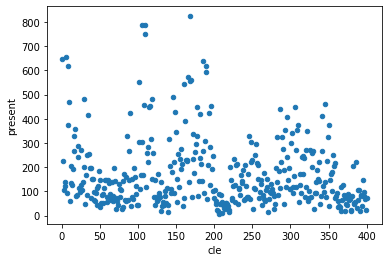

In [ ]:
dfc.plot.scatter(x='cle',y='present')
# the combination 'AA' is the number 0 and it appears 132 times overall

<!-- Open questions

*   How can we access files on Github? Changing the link from "github.com" to "raw.githubusercontent.com" (and adding "blob") does not work.
*   Should we do any other NLP-specific EDA that we have not done yet?
 -->


## DNA Binding Data Analysis

In [ ]:
import sys

# Installs
# !"{sys.executable}" -m pip install -U pandas-profiling[notebook]
# !pip install -U pandas_profiling
# !jupyter nbextension enable --py widgetsnbextension

In [ ]:
#Import Libraries
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file
import matplotlib.pylab as plt
import seaborn as sns #Understanding my variables
from pathlib import Path

# Installed packages
from ipywidgets import widgets

In [ ]:
train_data_path = '/content/dna_binding/train.csv'
test_data_path = '/content/dna_binding/test.csv'
df_train = pd.read_csv(train_data_path) 
df_test = pd.read_csv(test_data_path) 


In [ ]:
# data points
df_train.shape

(14189, 4)

In [ ]:
# data columns/features
df_train.columns

Index(['code', 'sequence', 'label', 'origin'], dtype='object')

In [ ]:
df_train.head()

,code,sequence,label,origin,sequence_length,code_str
0,Q6A8L0,MSGHSKWATTKHKKAAIDAKRGKLFARLIKNIEVAARLGGGDPSGN...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,264,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
1,Q7V7T9,MIGWLQGQKVEAWQQGTRQGVVLACAGVGYEVQIAPRHLSEMEHGQ...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,225,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
2,Q9ZUP2,MARILRNVYSLRSSLFSSELLRRSVVGTSFQLRGFAAKAKKKSKSD...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,430,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
3,Q2JVG1,MKCPRCGKQEIRVLESRSAEGGQSVRRRRECMSCGYRFTTYERIEF...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,200,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
4,Q9K4Q3,MTKADIIEGVYEKVGFSKKESAEIVELVFDTLKETLERGDKIKISG...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,129,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...


In [ ]:
# sample observations
df_train.sample(5)

,code,sequence,label,origin,sequence_length,code_str
10119,Q3JPY2,MTKSELVAQLASRFPQLVLKDADFAVKTMLDAMSDALSKGHRIEIR...,0,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,107,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
4254,Q8S8P5,MAASFLTMDNSRTRQNMNGSANWSQQSGRTSTSSLEDLEIPKFRSF...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,519,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
5656,Q9CAN9,MADPNNPITEPKAIIQSSTSSSVTIVPVPTCGDSLSDSATCENPCP...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,248,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
2999,Q554C5,MGAQYSTELNKYNNNNNNNNNNNNNNNNNNNNHTISGNENLNNNNN...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,1271,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...
3654,A7TPF8,MTDFSNWSCEYHTTFDEIVRIENKFKEHLKVDKRTRRRLLECCSKD...,1,https://github.com/hfuulgb/PDB-Fusion/tree/mai...,718,0 Q6A8L0\n1 Q7V7T9\n2 Q9Z...


In [ ]:
# checking for null values
df_train.isnull().sum()

code        0
sequence    0
label       0
origin      0
dtype: int64

In [ ]:
# .nunique(axis=0) returns the number of unique values for each variable.
# It is evident 173 sequences are duplicates
df_train.nunique(axis=0)

code        14189
sequence    14016
label           2
origin          1
dtype: int64

In [ ]:
# .describe() summarizes the count, mean, standard deviation, min, and max
df_train.describe().apply(lambda s: s.apply(lambda x: format(x, 'f')))

,label,sequence_length
count,14189.000000,14189.000000
mean,0.502431,425.287335
std,0.500012,373.224891
min,0.000000,47.000000
25%,0.000000,189.000000
50%,1.000000,327.000000
75%,1.000000,520.000000
max,1.000000,4911.000000


In [ ]:
# a look at discrete variables
df_train.sequence.unique()

array(['MSGHSKWATTKHKKAAIDAKRGKLFARLIKNIEVAARLGGGDPSGNPTLYDAIQKAKKSSVPNDNITRAVKRGSGEGADAVNYETIMYEAYGPAGVAILIECLTDNRNRAVSDVRVAVTRNGGTMADGGSVQRLFQRKGVVSVSKTYEVEEGRKTETREVDEDQLMEATIDAEPEDIVDEGEVFEIISDPSAVVDVRKAVQGAGIDYDSAEVSFKPDFTQRVELEDARKLYRILDALEDLDDVQNVFSNVDIPAEVAAALDEEE',
       'MIGWLQGQKVEAWQQGTRQGVVLACAGVGYEVQIAPRHLSEMEHGQNTFILWIHQVQRDDGSSLFGFPERRERDMFRTLIGVSGVGPQMALALLEECQTGELVEAIVQGDLRKLCQAQGVGKRTAERLAVELRTKLAEFSCRDPGMSLVDNGVIDSHQLKDSSLHELQITLGGLGYEDLEIRRAIRAVASGAAIGASDMPESVPSIDDTDAWLRASLRWLSQEAA',
       'MARILRNVYSLRSSLFSSELLRRSVVGTSFQLRGFAAKAKKKSKSDGNGSSEEGMSKKEIALQQALDQITSSFGKGSIMYLGRAVSPRNVPVFSTGSFALDVALGVGGLPKGRVVEIYGPEASGKTTLALHVIAEAQKQGGTCVFVDAEHALDSSLAKAIGVNTENLLLSQPDCGEQALSLVDTLIRSGSVDVIVVDSVAALVPKGELEGEMGDAHMAMQARLMSQALRKLSHSLSLSQTLLIFINQVRSKLSTFGGFGGPTEVTCGGNALKFYASMRLNIKRIGLIKKGEETTGSQVSVKIVKNKLAPPFRTAQFELEFGKGICKITEIIDLSIKHKFIAKNGTFYNLNGKNYHGKEALKRFLKQNESDQEELMKKLQDKLIADEAADKETESESEEEDSLRVVVSPDNTDDESPALVVGAAAVVVEAA',
       ...,
       'MSLESFDKDIYSLVNKELERQCDHLEMI

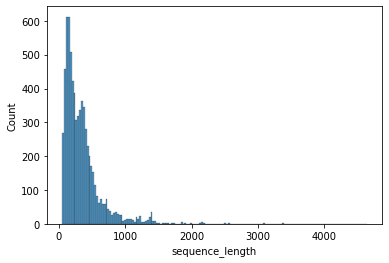

In [ ]:
# sequence distribution by length for all label = 0
df_train['sequence_length'] = df_train['sequence'].str.len()
sns.histplot(data=df_train[df_train['label']==0], x='sequence_length')

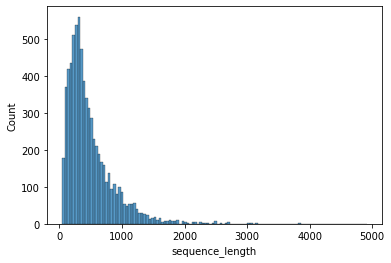

In [ ]:
# sequence distribution by length for all label = 1
sns.histplot(data=df_train[df_train['label']==1], x='sequence_length')

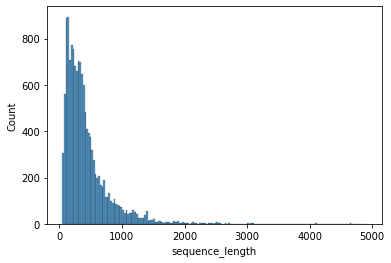

In [ ]:
# sequence distribution by length for all labels
# most sequences length range between 100 and 1500 characters
# a few sequences have lengths above 4000 characters
sns.histplot(data=df_train, x='sequence_length')

In [ ]:
# df_train['code_in_seq'] = df_train['code'].str in df_train['sequence'].str.cont
df_train['code_str'] = str(df_train['code'])

The dataset profile below gives a detailed tabular analysis of the DNA data binding.

In [ ]:
# Summarized Profile
profile_all = ProfileReport(
    df_train, title="DNA Binding Train Set", html={"style": {"full_width": True}}, sort=None
)
profile_all.to_widgets()
profile_all

/usr/local/lib/python3.8/dist-packages/pandas_profiling/profile_report.py:452: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

LSAEGK